# Dry Beans classification

## Importing data

In [1]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

# bean_data dataframe
df = pd.read_csv("input/bean-data.csv") # there are no missing values
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [2]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


The variable's description is as follows:

1. Area (`A`): The area of a bean zone and the number of pixels within its
   boundaries.
2. Perimeter (`P`): Bean circumference is defined as the length of its border.
3. Major axis length (`L`): The distance between the ends of the longest line
   that can be drawn from a bean.
4. Minor axis length (`l`): The longest line that can be drawn from the bean
   while standing perpendicular to the main axis.
5. Aspect ratio (`K`): Defines the relationship between L and l.
6. Eccentricity (`Ec`): Eccentricity of the ellipse having the same moments as
   the region.
7. Convex area (`C`): Number of pixels in the smallest convex polygon that can
   contain the area of a bean seed.
8. Equivalent diameter (`Ed`): The diameter of a circle having the same area as
   a bean seed area.
9. Extent (`Ex`): The ratio of the pixels in the bounding box to the bean area.
10. Solidity (`S`): Also known as convexity. The ratio of the pixels in the
    convex shell to those found in beans.
11. Roundness (`R`): Calculated with the following formula:
    `(4 * %pi * A) / (P^2)`
12. Compactness (`CO`): Measures the roundness of an object: `Ed / L`
13. ShapeFactor1 (`SF1`)
14. ShapeFactor2 (`SF2`)
15. ShapeFactor3 (`SF3`)
16. ShapeFactor4 (`SF4`)
17. Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

## Checking data

In [3]:
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

The dataset we have has no missing values.

### Scatterplot matrix

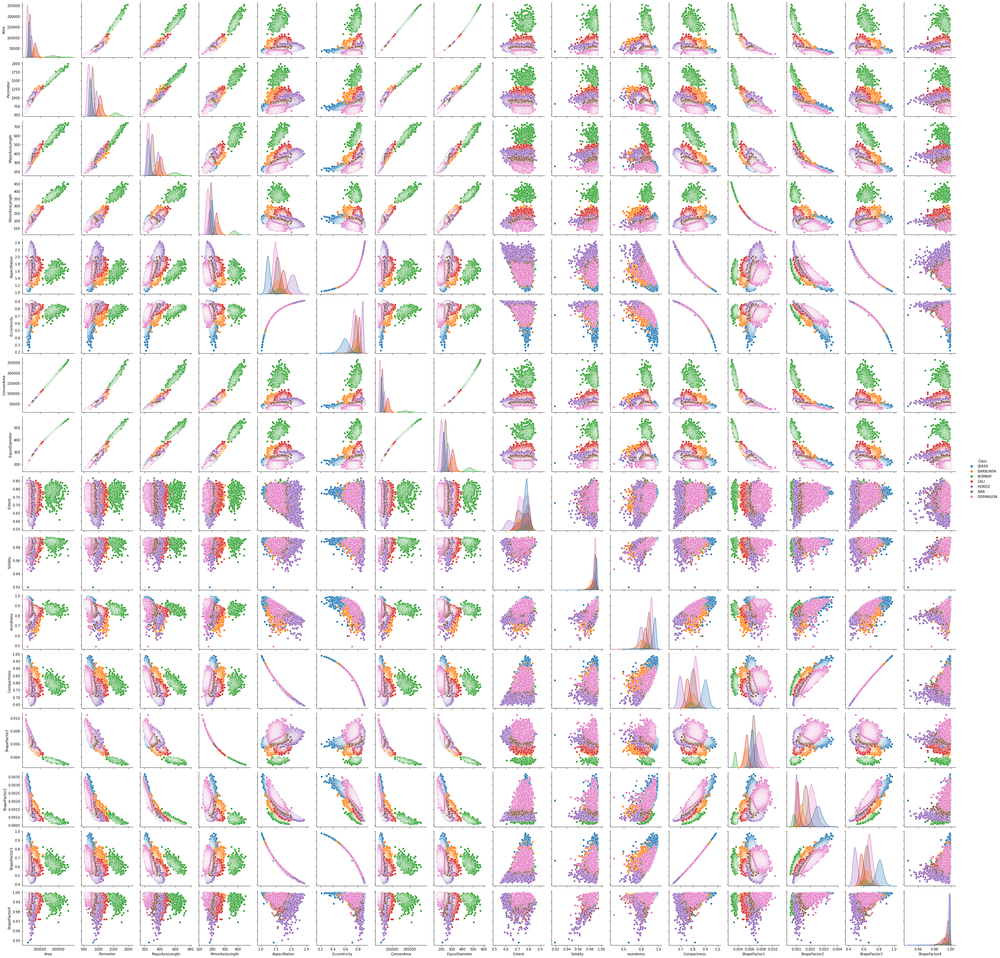

In [4]:
sb.pairplot(df, hue="Class");

From the scatterplot matrix, we can see that:

1. There are 7 classes: Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira. This is what we wanted.
2. There are many outliers that may be erroneous, e.g.:
  - 1 Area entry for Barbunya
  - 1 Solidity entry for Seker
  - 1 Roundness entry for Dermason

## Tyding data

### Removing outliers

In [ ]:
# Separate the targe label (y) from the data (X)

# "Area", "Perimeter", "MajorAxisLength", "MinorAxisLength", "AspectRation", "Eccentricity",
# "ConvexArea", "EquivDiameter", "Extent", "Solidity", "roundness", "Compactness", 
# "ShapeFactor1", "ShapeFactor2", "ShapeFactor3", "ShapeFactor4", "Class"

# inputs
X = df.drop(["Class"], axis=1)
# target (label)
y = df["Class"]

In [ ]:
import scipy.stats as stats

# find absolute value of z-score for each observation
z = np.abs(stats.zscore(X))

# only keep rows in dataframe with all z-scores less than absolute value of 2
df_clean = df[(z<2).all(axis=1)]
print(df.shape, df_clean.shape)

sb.pairplot(df_clean, hue="Class");

Even after this 'clean up', we still have some attributes that are derived (aggregation) and others that are highly correlated. We need to take care of those, in order to simplify the model.

## Violin plots

### Attribute correlation

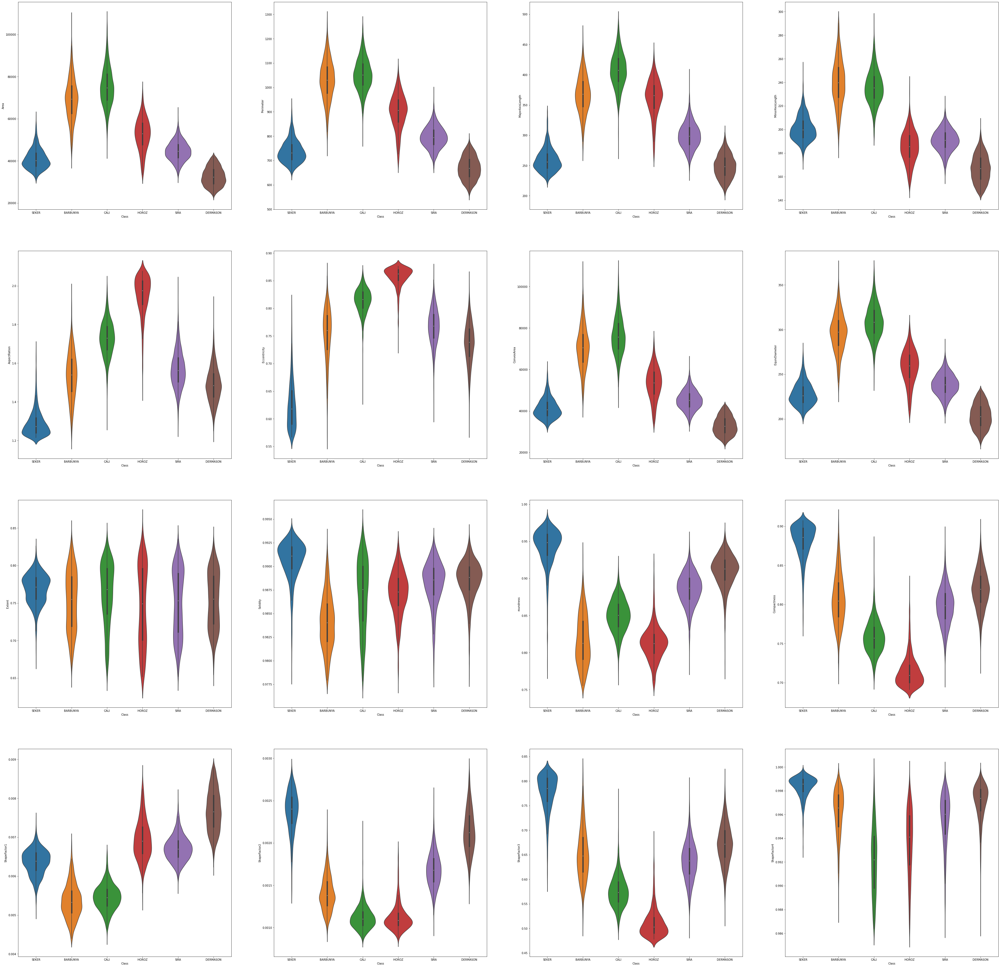

In [7]:
plt.figure(figsize=(64, 64))

for column_index, column in enumerate(df_clean.columns):
    if column == 'Class':
        continue
    plt.subplot(4, 4, column_index + 1)
    sb.violinplot(x='Class', y=column, data=df_clean)

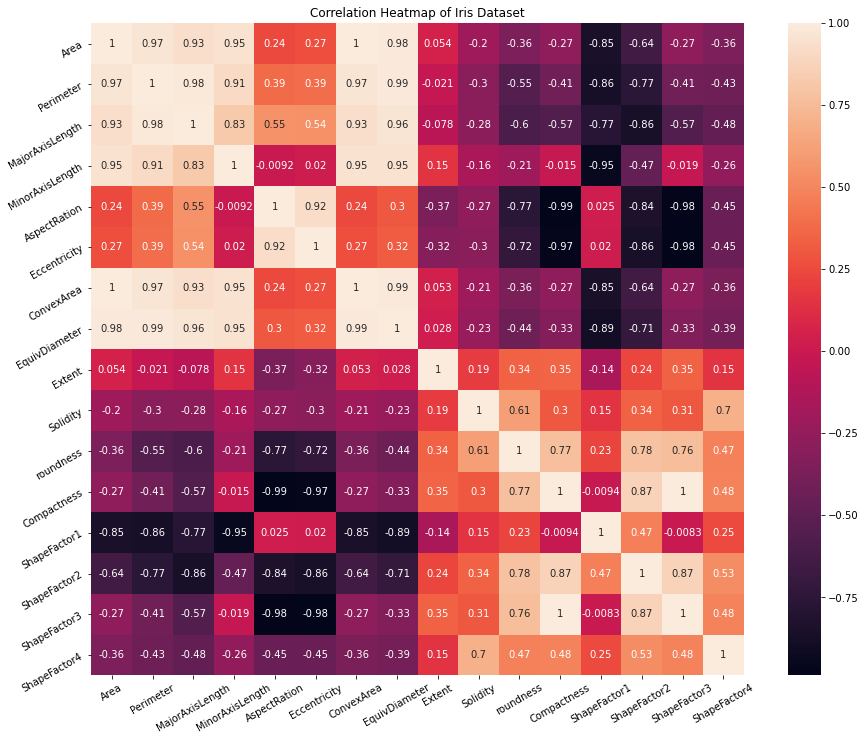

In [8]:
# create correlation matrix
corr_matrix = df.corr();

# create correlation heatmap
plt.figure(figsize=(16.0, 12.0))
plt.title('Correlation Heatmap of Iris Dataset')
a = sb.heatmap(corr_matrix, square=True, annot=True, fmt='.2g', linecolor='black');
a.set_xticklabels(a.get_xticklabels(), rotation=30)
a.set_yticklabels(a.get_yticklabels(), rotation=30)
plt.show();

If the correlation between two features is greater than 0 this means that increasing the values in one
feature will cause an increase of the in the other feature (the closer the correlation coefficient is
to 1 and the stronger is going to be this bond between the two different features).

Correlations lesser than 0 mean increasing the value will cause a decrease of the value of the other feature.

In [9]:
# select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
upper

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,NaN,0.966722,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721
Perimeter,NaN,NaN,0.977338,0.913179,0.385276,0.391066,0.967689,0.991380,-0.021160,-0.303970,-0.547647,-0.406857,-0.864623,-0.767592,-0.408435,-0.429310
MajorAxisLength,NaN,NaN,NaN,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527
MinorAxisLength,NaN,NaN,NaN,NaN,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749
AspectRation,NaN,NaN,NaN,NaN,NaN,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264
Eccentricity,NaN,NaN,NaN,NaN,NaN,NaN,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354
ConvexArea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049
EquivDiameter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512
Extent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502
Solidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163


Attributes that are too correlated (absolute value greater than 0.9) will be dropped.

In [10]:
# find feature columns with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.9)]
print("Attributes to drop:", to_drop)

df_new = df_clean.drop(to_drop, axis=1) # drop the attributes
df_new.to_csv('input/bean-data-clean.csv', index=False); # save to disk

df_new.head()

Attributes to drop: ['Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Compactness', 'ShapeFactor1', 'ShapeFactor3']


,Area,AspectRation,Extent,Solidity,roundness,ShapeFactor2,ShapeFactor4,Class
23,31637,1.308864,0.761823,0.987268,0.921842,0.002610,0.999091,SEKER
24,31675,1.382816,0.740936,0.989565,0.920929,0.002387,0.994950,SEKER
29,31811,1.238051,0.773877,0.992481,0.969600,0.002831,0.999515,SEKER
31,31823,1.225284,0.774848,0.986026,0.911040,0.002875,0.999481,SEKER
32,31837,1.246471,0.785246,0.987561,0.928538,0.002798,0.998843,SEKER


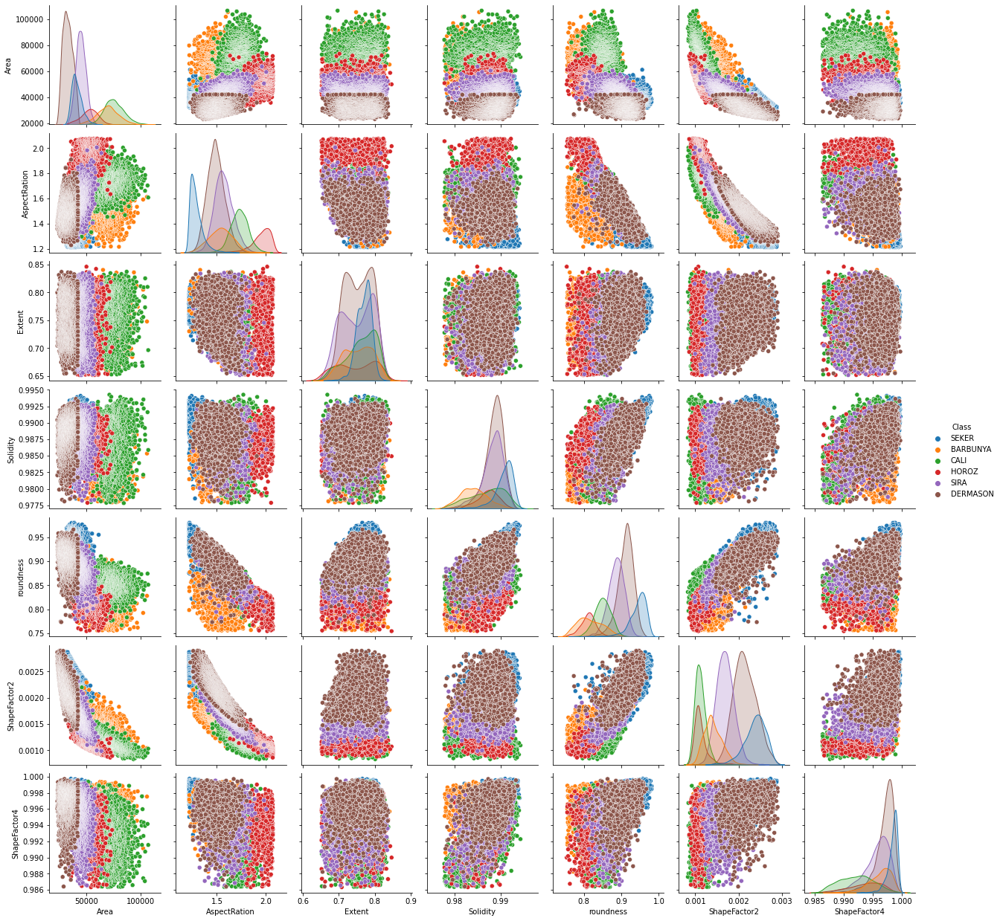

In [11]:
sb.pairplot(df_new, hue="Class");

The data looks a lot better now.

In [38]:
# inputs
X = df_new.drop(["Class"], axis=1)
# target (label)
y = df_new["Class"]

## Classification

### Helper functions

In [39]:
import sklearn.metrics as metrics

def print_metrics(test_labels, pred_labels, avg=None):
    print("Accuracy Score: {}".format(metrics.accuracy_score(test_labels, pred_labels)))
    print("Precision Score: {}".format(metrics.precision_score(test_labels, pred_labels, average=avg)))
    print("Recall Score: {}".format(metrics.recall_score(test_labels, pred_labels, average=avg)))
    print("F1 Score: {}".format(metrics.f1_score(test_labels, pred_labels, average=avg)))
    print("Confusion matrix:\n{}".format(metrics.confusion_matrix(test_labels, pred_labels)))

In [40]:
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics

def classify(name, classifier, iterations=1000, test_size=0.25):
    print(name)
    
    model_accuracies = []
    for repetition in range(iterations):
        (X_train, X_test, y_train, y_test) = train_test_split(X, y, test_size=test_size) # , random_state=1
    
        clf = classifier()
        clf.fit(X_train, y_train)
        y_pred = dtc.predict(X_test)
        clf_accuracy = metrics.accuracy_score(y_test, y_pred)
        model_accuracies.append(clf_accuracy)
    
    print_metrics(y_test, y_pred)
    plt.hist(model_accuracies);

### Decision tree

Decision tree
Accuracy Score: 0.9683098591549296
Precision Score: [0.98884758 0.96153846 0.96568627 0.97515528 0.97005988 0.96385542]
Recall Score: [0.96727273 0.98360656 0.97404203 0.9691358  0.97297297 0.95238095]
F1 Score: [0.97794118 0.97244733 0.96984615 0.97213622 0.97151424 0.95808383]
Confusion matrix:
[[266   8   0   1   0   0]
 [  2 300   0   2   0   1]
 [  0   0 788   0   4  17]
 [  0   3   2 157   0   0]
 [  0   0   3   0 324   6]
 [  1   1  23   1   6 640]]


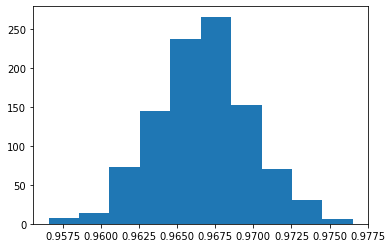

In [41]:
from sklearn.tree import DecisionTreeClassifier

classify("Decision tree", DecisionTreeClassifier)

### K-Nearest Neighbors

K-Nearest Neighbors
Accuracy Score: 0.9663536776212832
Precision Score: [0.97416974 0.96969697 0.97022333 0.96373057 0.98083067 0.95023328]
Recall Score: [0.97416974 0.96385542 0.97142857 0.96373057 0.98083067 0.9517134 ]
F1 Score: [0.97416974 0.96676737 0.97082557 0.96373057 0.98083067 0.95097276]
Confusion matrix:
[[264   6   0   0   0   1]
 [  7 320   0   3   0   2]
 [  0   0 782   1   1  21]
 [  0   2   2 186   0   3]
 [  0   0   1   0 307   5]
 [  0   2  21   3   5 611]]


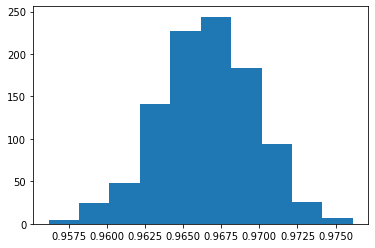

In [36]:
from sklearn.neighbors import KNeighborsClassifier

classify("K-Nearest Neighbors", KNeighborsClassifier)

### Naive Bayes

Naive Bayes
Accuracy Score: 0.9730046948356808
Precision Score: [1.         0.97885196 0.97407407 0.9744898  0.96258503 0.96183206]
Recall Score: [0.97472924 0.99082569 0.972873   0.97948718 0.96587031 0.96477795]
F1 Score: [0.98720293 0.98480243 0.97347316 0.9769821  0.96422487 0.96330275]
Confusion matrix:
[[270   5   1   0   0   1]
 [  0 324   0   3   0   0]
 [  0   0 789   0   6  16]
 [  0   1   2 191   0   1]
 [  0   0   3   0 283   7]
 [  0   1  15   2   5 630]]


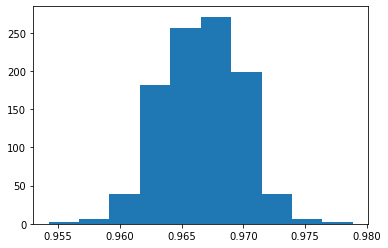

In [37]:
from sklearn.naive_bayes import GaussianNB

classify("Naive Bayes", GaussianNB)